In [116]:
import pandas as pd
import numpy as np
import re
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [182]:
import warnings
warnings.filterwarnings("ignore")

In [117]:
airbnb_df = pd.read_csv(r'C:\Users\Arindham Krishna\OneDrive\Desktop\Projects for Portfolio\Data Cleaning\Air Bnb Data\AB_NYC_2019.csv\AB_NYC_2019.csv')

In [118]:
airbnb_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [119]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [120]:
airbnb_df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

We can see that we have got empty values in Name,Host name, last review and reviews per month. Lets get in deeper

In [121]:
airbnb_df[airbnb_df["name"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2854,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
3703,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6269,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,NaN,NaN,1,0
6567,4756856,NaN,1832442,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,NaN,NaN,1,0
6605,4774658,NaN,24625694,Josh,Manhattan,Washington Heights,40.85198,-73.93108,Private room,40,1,0,NaN,NaN,1,0
8841,6782407,NaN,31147528,Huei-Yin,Brooklyn,Williamsburg,40.71354,-73.93882,Private room,45,1,0,NaN,NaN,1,0
11963,9325951,NaN,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
12824,9787590,NaN,50448556,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300,5,0,NaN,NaN,5,0


We can see that the missing values in the bnb names column also seems to have majority of 0 number of reviews and also last review date is missing. Clearly states the possibility that the specific airbnbs have not got any reviews till date. 

Moving forward, we can go ahead and drop the airbnbs with missing names with 0 reviews recieved and we will only keep which have got 1 or more reviews and then we will replace the missing airbnb names with unknown. 


In [122]:
list_columns = ['name','last_review']
airbnb_df.dropna(subset=list_columns,inplace=True, how='all')

In [123]:
airbnb_df[airbnb_df["name"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
3703,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
11963,9325951,NaN,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
13401,10052289,NaN,49522403,Vanessa,Brooklyn,Brownsville,40.66409,-73.92314,Private room,50,3,3,2016-08-18,0.07,1,362
28889,22275821,NaN,49662398,Kathleen,Brooklyn,Bushwick,40.69546,-73.92741,Entire home/apt,110,4,5,2018-08-13,0.27,1,0


Now, we can see that in the above frame that out of 16 missing values we are left with 6 missing values. Reason for keeping these 6 missing values is that they do have received reviews from the guests. Let's replace these missing value with value 'Unknown'

In [124]:
airbnb_df["name"].fillna('Unknown', inplace = True)

In [125]:
airbnb_df[airbnb_df["name"] == 'Unknown']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
3703,2232600,Unknown,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,4209595,Unknown,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,4370230,Unknown,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
11963,9325951,Unknown,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
13401,10052289,Unknown,49522403,Vanessa,Brooklyn,Brownsville,40.66409,-73.92314,Private room,50,3,3,2016-08-18,0.07,1,362
28889,22275821,Unknown,49662398,Kathleen,Brooklyn,Bushwick,40.69546,-73.92741,Entire home/apt,110,4,5,2018-08-13,0.27,1,0


In [126]:
airbnb_df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10042
reviews_per_month                 10042
calculated_host_listings_count        0
availability_365                      0
dtype: int64

1. We can see now that missing names of airbnb have been replaced from NaN to 'Unkown'
2. Also, we can see that there are 0 missing values in the name columns. 

In [127]:
airbnb_df[airbnb_df["host_name"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
360,100184,Bienvenue,526653,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2700,1449546,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5745,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6075,4446862,Charming Room in Prospect Heights!,23077718,NaN,Brooklyn,Crown Heights,40.67512,-73.96146,Private room,50,1,0,NaN,NaN,1,0
6582,4763327,"Luxurious, best location, spa inc'l",24576978,NaN,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8163,6292866,Modern Quiet Gem Near All,32722063,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8257,6360224,"Sunny, Private room in Bushwick",33134899,NaN,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8852,6786181,R&S Modern Spacious Hideaway,32722063,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9138,6992973,1 Bedroom in Prime Williamsburg,5162530,NaN,Brooklyn,Williamsburg,40.71838,-73.95630,Entire home/apt,145,1,0,NaN,NaN,1,0
9817,7556587,Sunny Room in Harlem,39608626,NaN,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0


Again even in the host name column we have missing values, let's drop the missing host names with 0 number of reviews and missing last review. 

In [128]:
list_columns_names = ['host_name','last_review']
airbnb_df.dropna(subset=list_columns_names,inplace=True, how='all')

In [129]:
airbnb_df[airbnb_df["host_name"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
360,100184,Bienvenue,526653,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2700,1449546,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5745,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6582,4763327,"Luxurious, best location, spa inc'l",24576978,NaN,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8163,6292866,Modern Quiet Gem Near All,32722063,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8257,6360224,"Sunny, Private room in Bushwick",33134899,NaN,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8852,6786181,R&S Modern Spacious Hideaway,32722063,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9817,7556587,Sunny Room in Harlem,39608626,NaN,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0
14040,10709846,"Sunny, spacious room in Greenpoint",7822683,NaN,Brooklyn,Greenpoint,40.73539,-73.95838,Private room,55,10,2,2016-11-05,0.05,1,0
14631,11553543,Cozy Room Astoria,26138712,NaN,Queens,Ditmars Steinway,40.77587,-73.91775,Private room,45,1,5,2017-01-01,0.13,1,0


In [130]:
airbnb_df["host_name"].fillna('Unknown', inplace = True)

In [131]:
airbnb_df[airbnb_df["host_name"] == 'Unknown']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
360,100184,Bienvenue,526653,Unknown,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2700,1449546,Cozy Studio in Flatbush,7779204,Unknown,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5745,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,Unknown,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6582,4763327,"Luxurious, best location, spa inc'l",24576978,Unknown,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8163,6292866,Modern Quiet Gem Near All,32722063,Unknown,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8257,6360224,"Sunny, Private room in Bushwick",33134899,Unknown,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8852,6786181,R&S Modern Spacious Hideaway,32722063,Unknown,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9817,7556587,Sunny Room in Harlem,39608626,Unknown,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0
14040,10709846,"Sunny, spacious room in Greenpoint",7822683,Unknown,Brooklyn,Greenpoint,40.73539,-73.95838,Private room,55,10,2,2016-11-05,0.05,1,0
14631,11553543,Cozy Room Astoria,26138712,Unknown,Queens,Ditmars Steinway,40.77587,-73.91775,Private room,45,1,5,2017-01-01,0.13,1,0


All the missing host names have been updated with Unknown, however these were not removed as these hotels have recieved reviews. 

In [132]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48880 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48880 non-null  int64  
 1   name                            48880 non-null  object 
 2   host_id                         48880 non-null  int64  
 3   host_name                       48880 non-null  object 
 4   neighbourhood_group             48880 non-null  object 
 5   neighbourhood                   48880 non-null  object 
 6   latitude                        48880 non-null  float64
 7   longitude                       48880 non-null  float64
 8   room_type                       48880 non-null  object 
 9   price                           48880 non-null  int64  
 10  minimum_nights                  48880 non-null  int64  
 11  number_of_reviews               48880 non-null  int64  
 12  last_review                     

In [133]:
airbnb_df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10037
reviews_per_month                 10037
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [134]:
airbnb_df[airbnb_df["last_review"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


last_review and reviews per month both are empty and basically when the number of reviews are 0 then automatically this will be null, so lets just drop all the null values

In [135]:
airbnb_df = airbnb_df.dropna()

In [136]:
airbnb_df.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

Now that we have cleaned the data, lets do the visualization. 

In [137]:
len(airbnb_df.host_name.unique())

9887

In [138]:
top_hostnames = airbnb_df.host_name.value_counts().head(10)
print(top_hostnames)

Michael         335
David           309
John            250
Alex            229
Sonder (NYC)    207
Sarah           179
Maria           174
Daniel          170
Jessica         170
Anna            160
Name: host_name, dtype: int64


In [139]:
top_hosts = airbnb_df.host_id.value_counts().head(10)
print(top_hosts)

219517861    207
61391963      79
16098958      61
137358866     51
7503643       49
190921808     46
30283594      43
1475015       42
120762452     40
2119276       39
Name: host_id, dtype: int64


In [140]:
top_places =airbnb_df.neighbourhood.value_counts().head(10)
print(top_places)

Williamsburg          3163
Bedford-Stuyvesant    3141
Harlem                2206
Bushwick              1944
Hell's Kitchen        1532
East Village          1490
Upper West Side       1482
Upper East Side       1405
Crown Heights         1265
Midtown                986
Name: neighbourhood, dtype: int64


In [141]:
top_places_df = pd.DataFrame(top_places)
top_places_df.reset_index(inplace=True)
top_places_df.rename(columns={'index':'Neighbhorhood Name','neighbourhood':'count'},inplace=True)
top_places_df

,Neighbhorhood Name,count
0,Williamsburg,3163
1,Bedford-Stuyvesant,3141
2,Harlem,2206
3,Bushwick,1944
4,Hell's Kitchen,1532
5,East Village,1490
6,Upper West Side,1482
7,Upper East Side,1405
8,Crown Heights,1265
9,Midtown,986


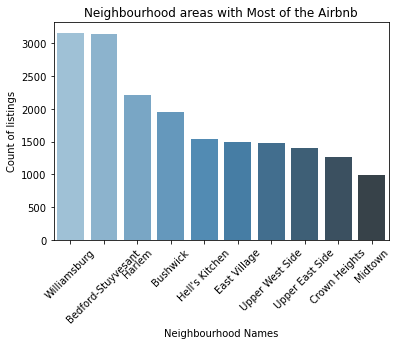

In [142]:
viz_1=sns.barplot(x="Neighbhorhood Name", y="count", data=top_places_df,
                 palette='Blues_d')
viz_1.set_title('Neighbourhood areas with Most of the Airbnb')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Neighbourhood Names')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)
plt.show()

In [143]:
fig = px.scatter(airbnb_df, x="calculated_host_listings_count", y="number_of_reviews")
fig.show()

In [144]:
fig2 = px.scatter(airbnb_df, x="number_of_reviews", y="reviews_per_month")
fig2.show()

In [145]:
# data_canada = px.data.gapminder().query("country == 'Canada'")
fig3 = px.histogram(airbnb_df, x='neighbourhood_group', color = 'room_type',barmode='group',text_auto= True)
fig3.show()

In [146]:
airbnb_df.nlargest(10, 'number_of_reviews')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173
10623,8168619,Steps away from Laguardia airport,37312959,Maya,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,2019-07-01,11.59,5,163
1879,834190,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Carol,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,2019-07-06,6.95,1,179
20403,16276632,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Danielle,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,2019-07-06,16.22,5,341
4870,3474320,Private brownstone studio Brooklyn,12949460,Asa,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,2019-07-01,8.14,1,269
471,166172,LG Private Room/Family Friendly,792159,Wanda,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,2019-07-07,6.70,1,0


In [147]:
airbnb_df.nlargest(10, 'price')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
9151,7003697,Furnished room in Astoria apartment,20582832,Kathrine,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,2016-02-13,0.04,1,0
17692,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0
6530,4737930,Spanish Harlem Apt,1235070,Olson,Manhattan,East Harlem,40.79264,-73.93898,Entire home/apt,9999,5,1,2015-01-02,0.02,1,0
12342,9528920,"Quiet, Clean, Lit @ LES & Chinatown",3906464,Amy,Manhattan,Lower East Side,40.71355,-73.98507,Private room,9999,99,6,2016-01-01,0.14,1,83
30268,23377410,Beautiful/Spacious 1 bed luxury flat-TriBeCa/Soho,18128455,Rum,Manhattan,Tribeca,40.72197,-74.00633,Entire home/apt,8500,30,2,2018-09-18,0.18,1,251
4377,2953058,Film Location,1177497,Jessica,Brooklyn,Clinton Hill,40.69137,-73.96723,Entire home/apt,8000,1,1,2016-09-15,0.03,11,365
45666,34895693,Gem of east Flatbush,262534951,Sandra,Brooklyn,East Flatbush,40.65724,-73.92450,Private room,7500,1,8,2019-07-07,6.15,2,179
3537,2110145,UWS 1BR w/backyard + block from CP,2151325,Jay And Liz,Manhattan,Upper West Side,40.77782,-73.97848,Entire home/apt,6000,14,17,2015-02-17,0.27,1,359
43009,33397385,Midtown Manhattan great location (Gramacy park),16105313,Debra,Manhattan,Midtown,40.74482,-73.98367,Entire home/apt,5100,30,1,2019-06-22,1.00,2,343
2698,1448703,Beautiful 1 Bedroom in Nolita/Soho,213266,Jessica,Manhattan,Nolita,40.72193,-73.99379,Entire home/apt,5000,1,2,2013-09-28,0.03,1,365


In [148]:
airbnb_df.nlargest(10, 'minimum_nights')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5767,4204302,Prime W. Village location 1 bdrm,17550546,Genevieve,Manhattan,Greenwich Village,40.73293,-73.99782,Entire home/apt,180,1250,2,2014-11-09,0.03,1,365
13404,10053943,Historic Designer 2 Bed. Apartment,2697686,Glenn H.,Manhattan,Harlem,40.82915,-73.94034,Entire home/apt,99,999,2,2018-01-04,0.07,1,42
26341,20990053,Beautiful place in Brooklyn! #2,151084261,Angie,Brooklyn,Williamsburg,40.71772,-73.95059,Private room,79,999,24,2018-06-28,1.12,6,249
7355,5431845,Beautiful Fully Furnished 1 bed/bth,3680008,Aliya,Queens,Long Island City,40.75104,-73.93863,Entire home/apt,134,500,30,2018-06-24,0.57,1,90
11193,8668115,Zen Room in Crown Heights Brooklyn,8996336,Laura,Brooklyn,Crown Heights,40.67255,-73.94914,Private room,50,500,10,2016-09-22,0.22,1,365
1305,568684,800sqft apartment with huge terrace,2798644,Alessandra,Brooklyn,Bushwick,40.70202,-73.92402,Entire home/apt,115,370,6,2018-04-15,0.09,1,365
700,258690,CHELSEA 1 Bdrm Plus Sleeping Loft!!,1359611,Andrea,Manhattan,Chelsea,40.74618,-74.00392,Entire home/apt,195,365,10,2014-10-26,0.12,1,0
754,271694,"Easy, comfortable studio in Midtown",1387370,James,Manhattan,Midtown,40.75282,-73.97315,Entire home/apt,125,365,19,2015-09-08,0.21,1,365
2150,992977,Park Slope Pre-War Apartment,4000059,Shahdiya,Brooklyn,Park Slope,40.67359,-73.97434,Entire home/apt,100,365,1,2013-08-01,0.01,1,365
3945,2454507,Close to everything - Jr 1 bedroom,9991763,Andrew,Manhattan,Financial District,40.70781,-74.00701,Entire home/apt,130,365,6,2016-10-02,0.10,1,262


Now, lets look at this, here we can see that airbnb homes have set up requirement of minimum nights of upto 1250 days which is not possible in practical terms as well as legally. 

Minimum nights restriction can mostly go upto 30 days, legally if a guest is staying for around 30 days then they are no more called guests and are referred as tennants and hotels have to generate a diffenrent invoice and go ahead with differnet paper procedures. So, in this case lets remove the the minimum nights which are more than 150 days. 


In [154]:
fig_nights = px.box(airbnb_df, y="minimum_nights")
fig_nights.show()

There are several ways to remove the outliers but I will go ahead with IQR filtering. Where we will first find the Q1 and Q3 which is 25 and 75 percentile of your data. Post that we will find the IQR which IQR = Q3 - Q1. 

After we get our IQR, we can find out the upper limit and lower limits of our data. 
upper limit = Q3 + (1.5*IQR) and 
lower limit  = Q1 - (1.5*IQR)

In [162]:
Q1 = airbnb_df['minimum_nights'].quantile(0.25)
Q3 = airbnb_df['minimum_nights'].quantile(0.75)
print("value of Q1 and Q3 are",Q1 ,'and',Q3)

value of Q1 and Q3 are 1.0 and 4.0


In [164]:
IQR = Q3 - Q1
print("value of IQR is",IQR)

value of IQR is 3.0


In [166]:
lower_limit = Q1 - (1.5*IQR)
upper_limit = Q3 +(1.5*IQR)
print("upper and lower limits of minimum nights feature is", upper_limit,'and',lower_limit)

upper and lower limits of minimum nights feature is 8.5 and -3.5


In [175]:
#You can find the list of records that are outliers in the dataset. 
airbnb_df[airbnb_df['minimum_nights'] > upper_limit]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
14,6090,West Village Nest - Superhost,11975,Alina,Manhattan,West Village,40.73530,-74.00525,Entire home/apt,120,90,27,2018-10-31,0.22,1,0
27,9357,Midtown Pied-a-terre,30193,Tommi,Manhattan,Hell's Kitchen,40.76715,-73.98533,Entire home/apt,150,10,58,2017-08-13,0.49,1,75
29,9657,Modern 1 BR / NYC / EAST VILLAGE,21904,Dana,Manhattan,East Village,40.72920,-73.98542,Entire home/apt,180,14,29,2019-04-19,0.24,1,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47906,35974123,Downtown NYC - Across From the Freedom Tower!,73986440,Daniel,Manhattan,Financial District,40.71047,-74.00761,Entire home/apt,150,30,1,2019-07-03,1.00,1,53
48024,36038287,"Huge, Clean & Quiet room in a 2 BR Apt",167769983,Sara,Manhattan,Stuyvesant Town,40.73221,-73.97941,Private room,77,21,2,2019-06-25,2.00,1,321
48203,36137740,Cozy Kips Bay Apartment,30933227,Dipti,Manhattan,Kips Bay,40.74133,-73.97706,Entire home/apt,130,30,1,2019-06-28,1.00,1,54
48486,36280646,"Cable and wfi, L/G included.",272872092,Chris,Queens,Forest Hills,40.73657,-73.85088,Entire home/apt,16,9,1,2019-07-07,1.00,1,322


In [176]:
#No outliers in the lower limit area. 
airbnb_df[airbnb_df['minimum_nights'] < lower_limit]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365


In [179]:
#Lets trim and remove the outliers present in upper limit, please note that the angle bracket is changed.
#In the above line it was > upper_limit and here for trimming we use < upper_limit
newairbnb_df = airbnb_df[airbnb_df['minimum_nights'] < upper_limit]
newairbnb_df.shape

(34379, 16)

Lets compare the boxplots of previous data and new data. 

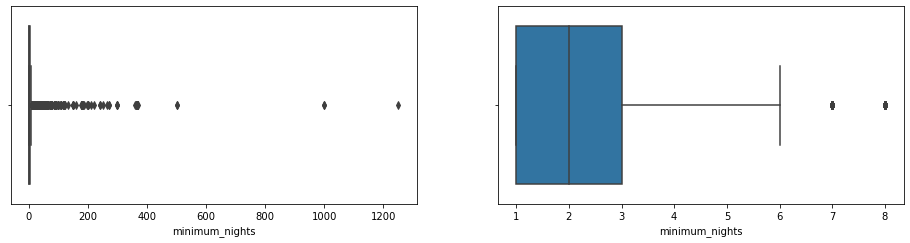

In [183]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.boxplot(airbnb_df['minimum_nights'])
plt.subplot(2,2,2)
sns.boxplot(newairbnb_df['minimum_nights'])
plt.show()

In [184]:
newairbnb_df.nlargest(10, 'minimum_nights')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
149,34760,Sunny Room in Old Historical Brooklyn Townhouse,149929,Obed,Brooklyn,Fort Greene,40.69101,-73.97312,Private room,44,8,27,2019-06-29,1.05,5,280
181,45910,Beautiful Queens Brownstone! - 5BR,204539,Mark,Queens,Ridgewood,40.70382,-73.89797,Entire home/apt,350,8,10,2019-05-12,0.11,5,365
422,144087,LUXURY OF THE HORIZON,616825,Rinaldo,Manhattan,Harlem,40.80473,-73.95320,Entire home/apt,259,8,17,2019-05-18,0.17,1,343
810,289020,Sunny 1BR Center of East Village!,347036,Jasmine,Manhattan,East Village,40.72948,-73.98694,Entire home/apt,179,8,15,2018-08-29,0.19,1,0
1094,460999,Beautiful duplex apt in Harlem,128890,Sara,Manhattan,Harlem,40.81620,-73.94747,Entire home/apt,100,8,8,2019-03-28,0.11,1,0
1407,629770,Slick Studio with High Ceilings,3129020,Ian,Manhattan,Gramercy,40.73326,-73.98245,Entire home/apt,99,8,6,2013-09-04,0.07,1,0
1685,764753,Beautiful 3 bedroom apartment!!,3371859,Jenny & Jose,Brooklyn,Crown Heights,40.67679,-73.93776,Entire home/apt,82,8,108,2019-06-16,1.33,2,238
1780,799945,"Very Small Room, Old Historic Brooklyn Townhouse",149929,Obed,Brooklyn,Fort Greene,40.68537,-73.97713,Private room,40,8,32,2019-06-29,0.40,5,284
1817,813225,"Quirky, Exposed-Brick Cozy Room Brooklyn Townh...",149929,Obed,Brooklyn,Fort Greene,40.68871,-73.97181,Private room,68,8,37,2019-07-02,0.50,5,280
1857,825550,Luxury 1BD in Historic Carrol Gardens Brownstone,4331864,Jeff,Brooklyn,Gowanus,40.67869,-73.99197,Entire home/apt,135,8,7,2019-04-27,0.14,1,0


In [103]:
checkfig = px.density_heatmap(airbnb_df, x="neighbourhood_group", y="room_type", z="price", histfunc="avg",title= 'Average Price of differnt Rooms in Different areas')
checkfig.show()

In [185]:
checkfig1 = px.density_heatmap(newairbnb_df, x="neighbourhood_group", y="room_type", z="price", histfunc="avg",title= 'Average Price of differnt Rooms in Different areas')
checkfig1.show()

We can see that there is not much of difference in avergae pricing in areas and room type before and after we removed the outlier. 

In [186]:
newtop_places =newairbnb_df.neighbourhood.value_counts().head(10)
print(newtop_places)

Williamsburg          2857
Bedford-Stuyvesant    2827
Harlem                1984
Bushwick              1763
East Village          1346
Hell's Kitchen        1306
Upper West Side       1192
Crown Heights         1148
Upper East Side       1099
East Harlem            871
Name: neighbourhood, dtype: int64


No difference in the top places as well. 

In [188]:
top_roomtype =airbnb_df.room_type.value_counts().head(10)
print(top_roomtype)

Entire home/apt    20332
Private room       17665
Shared room          846
Name: room_type, dtype: int64


In [189]:
newtop_roomtype =newairbnb_df.room_type.value_counts().head(10)
print(newtop_roomtype)

Entire home/apt    17453
Private room       16167
Shared room          759
Name: room_type, dtype: int64


In [190]:
airbnb_df.nlargest(10, 'number_of_reviews')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173
10623,8168619,Steps away from Laguardia airport,37312959,Maya,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,2019-07-01,11.59,5,163
1879,834190,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Carol,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,2019-07-06,6.95,1,179
20403,16276632,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Danielle,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,2019-07-06,16.22,5,341
4870,3474320,Private brownstone studio Brooklyn,12949460,Asa,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,2019-07-01,8.14,1,269
471,166172,LG Private Room/Family Friendly,792159,Wanda,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,2019-07-07,6.70,1,0


In [191]:
newairbnb_df.nlargest(10, 'number_of_reviews')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173
10623,8168619,Steps away from Laguardia airport,37312959,Maya,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,2019-07-01,11.59,5,163
1879,834190,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Carol,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,2019-07-06,6.95,1,179
20403,16276632,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Danielle,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,2019-07-06,16.22,5,341
4870,3474320,Private brownstone studio Brooklyn,12949460,Asa,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,2019-07-01,8.14,1,269
471,166172,LG Private Room/Family Friendly,792159,Wanda,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,2019-07-07,6.70,1,0


In [196]:
pd.pivot_table(airbnb_df,index= 'room_type',values = ["number_of_reviews"],aggfunc = "sum")

,number_of_reviews
room_type,
Entire home/apt,580403
Private room,538346
Shared room,19256


In [198]:
pd.pivot_table(airbnb_df,index= 'neighbourhood_group',values = ["number_of_reviews"],aggfunc = "sum")

,number_of_reviews
neighbourhood_group,
Bronx,28371
Brooklyn,486574
Manhattan,454569
Queens,156950
Staten Island,11541


In [205]:
avg_review_price = pd.pivot_table(airbnb_df,index= ['neighbourhood_group','room_type'],values = ["number_of_reviews","price"],aggfunc = "mean")
avg_review_price

number_of_reviews       price
neighbourhood_group room_type                                     
Bronx               Entire home/apt          37.627832  120.789644
                    Private room             31.129771   57.093511
                    Shared room              10.046512   56.930233
Brooklyn            Entire home/apt          32.720235  171.249265
                    Private room             26.730014   73.339797
                    Shared room              19.975862   45.458621
Manhattan           Entire home/apt          23.592555  230.190830
                    Private room             33.151054  106.603265
                    Shared room              28.853933   77.980337
Queens              Entire home/apt          34.812859  139.225603
                    Private room             34.910821   69.286567
                    Shared room              18.059211   64.467105
Staten Island       Entire home/apt          39.046667  125.366667
                    Private room             35.660377   57.584906
                    Shared room               2.800000   57.600000

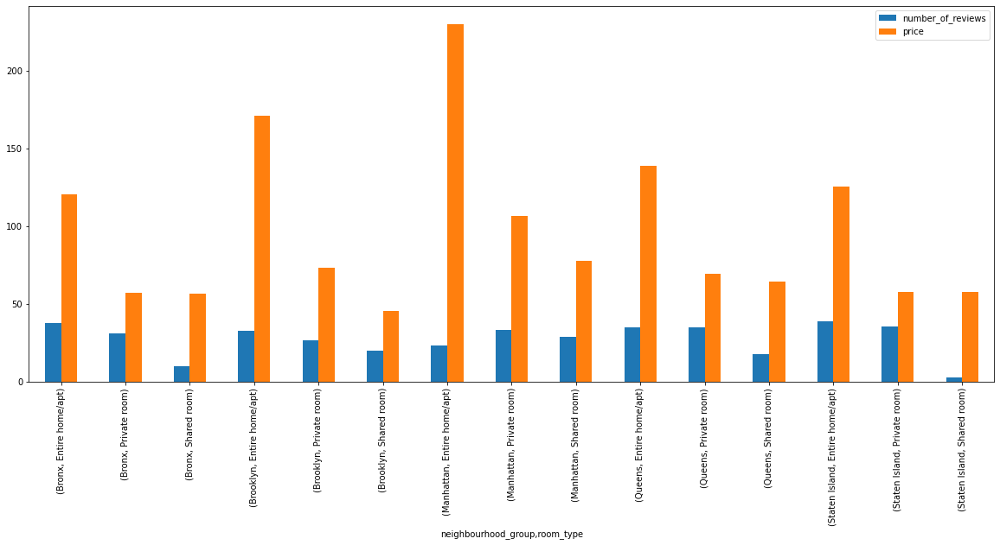

In [218]:
# plt.figure(figsize=(20,20))
avg_review_price.plot(kind='bar',figsize=(20,8))
plt.show()

From the plot above, you can see that on an average staten island and Queens cities have got more number of reviews for the airbnb. Whereas the pricing is high for Manhattan City and then you have got Brooklyn City 